## A brief word on the dependencies:
#### The notebook runs under python=3.7
#### To make the tensorflow correctly utilize GPU, I had to take a few actions. Firstly, I installed the latest drivers for my GPU. Secondly, I installed the libraries in the following order:
tensorflow-gpu=2.1.0 <br>
cudatoolkit=10.1 <br>
cudnn=7.6 <br>
#### If you already have a tensorflow or tensorflow-gpu installed, do the following:
Remove both tensorflow and tensorflow-gpu before installing the abovementioned libraries.
#### If the error persists, do the following.
Remove both tensorflow and tensorflow-gpu. Install the latest tensorflow-gpu, cudatoolkit and cudnn. Then install tensorflow-gpu=2.1.0, which will reinstall the correct versions of cudatoolkit and cudnn.
#### No need to install cuda and cudnn from nvidia separately.
#### A few other libraries which are not installed automatically nor imported explicitly, but are needed to execute the notebook:
pydot <br>
pydotplus <br>
graphviz <br>

In [1]:
import tensorflow as tf
import os
import time
from matplotlib import pyplot as plt
from IPython import display
import numpy as np
from tensorflow.python.client import device_lib
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print(device_lib.list_local_devices())

Num GPUs Available:  1
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 986021392973781114
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4986830848
locality {
  bus_id: 1
  links {
  }
}
incarnation: 9652404773611218565
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"
]


## Save checkpoints and logs to Google Drive when using Google Colab

In [2]:
def save_to_gdrive(save = False):
  if save:
    from google.colab import drive
    drive.mount('/content/drive')
    %cd drive/MyDrive/Colab Notebooks/drones

In [3]:
save_to_gdrive(False)

## Download the dataset and set the parameters

In [4]:
_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'
path_to_zip = tf.keras.utils.get_file('facades.tar.gz', origin=_URL, extract=True)
PATH = os.path.join(os.path.dirname(path_to_zip), 'facades/')

In [5]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 3
EPOCHS = 200

## Load the image from file

In [6]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)
  w = tf.shape(image)[1]
  w = w // 2
  real_image = image[:, :w, :]
  real_image = tf.cast(real_image, tf.float32)
  return real_image

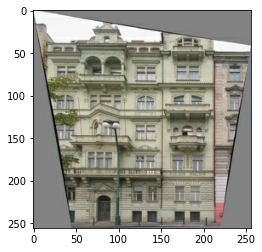

In [7]:
re = load(PATH+'train/100.jpg')
plt.figure()
plt.imshow(re/255.0)

## Random mirroring and jittering of the images

In [8]:
def resize(real_image, height, width):
  real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return real_image

In [9]:
def random_crop(real_image):
  cropped_image = tf.image.random_crop(real_image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
  return cropped_image

In [10]:
def normalize(real_image):
  real_image = (real_image / 127.5) - 1
  return real_image

In [11]:
@tf.function()
def random_jitter(real_image):
  # Resizing to 286 x 286 x 3
  real_image = resize(real_image, 286, 286)
  # Randomly cropping to 256 x 256 x 3
  real_image = random_crop(real_image)
  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    real_image = tf.image.flip_left_right(real_image)
  return real_image

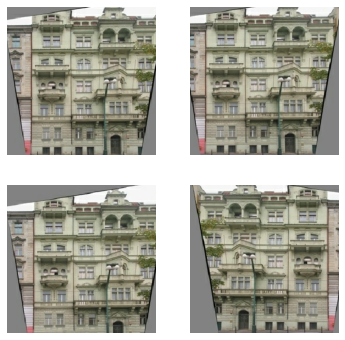

In [12]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_re = random_jitter(re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_re/255.0)
  plt.axis('off')
plt.show()

## Select train and test images

In [13]:
def load_image_train(image_file):
  real_image = load(image_file)
  real_image = random_jitter(real_image)
  real_image = normalize(real_image)
  return real_image

In [14]:
def load_image_test(image_file):
  real_image = load(image_file)
  real_image = resize(real_image, IMG_HEIGHT, IMG_WIDTH)
  real_image = normalize(real_image)
  return real_image

Autotune use may very here depending on the version of tensorflow. The original pix2pix paper uses tensorflow.1.

In [15]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [16]:
test_dataset = tf.data.Dataset.list_files(PATH+'test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Define the downsampling and upsampling
Print the shape of the sample image layer after downsampling and upsampling

In [17]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, 
                                    size, 
                                    strides=2, 
                                    padding='same', 
                                    kernel_initializer=initializer, 
                                    use_bias=False))
  if apply_batchnorm: 
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

In [18]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(re, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [19]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, 
                                             size, 
                                             strides=2, 
                                             padding='same', 
                                             kernel_initializer=initializer, 
                                             use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result

In [20]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


## Define and create a random noise and coordinates vectors
Unlike in pix2pix, we do not have the capacities to manually label all the masks. Therefore, we use a single-channel random noise vector as an input to the Generator, and a vector of X&Y coordinates to both the Generator and Discriminator.

In [21]:
def random_noise(batch_size, img_width, img_height):
    noise_vector = tf.random.normal([batch_size, img_width, img_height, 1]) * 16
    return noise_vector

In [22]:
def coordinates(img_width, img_height):
    X, Y = tf.meshgrid(tf.convert_to_tensor(np.arange(img_width)), 
                       tf.convert_to_tensor(np.arange(img_height)))
    coordinate_vector = tf.constant(normalize(tf.cast(tf.expand_dims(tf.stack([X, Y], 
                                                                              axis = -1), 
                                                                     axis = 0), 
                                                      tf.float32)))
    return coordinate_vector

In [23]:
z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
coord = coordinates(IMG_WIDTH, IMG_HEIGHT)

## Define the Generator. Plot the Generator training pipeline diagram.
Generator uses two inputs: 1-channel random noise vector and vector of x&y coordinates. Then the layers are concatenated. The resulted 3-channel layer is a subject to downsampling, with a following forwarding of the downsampled layer to a skip connection. After the input is fully downsampled, the upsampling begins, with the concatenation of the layers forwarded respectively with skip connection.

In [24]:
def Generator():
  z = tf.keras.layers.Input(shape=[256, 256, 1], name='z_vector')
  coordinates = tf.keras.layers.Input(shape=[256, 256, 2], name='coordinates')
  x = tf.keras.layers.Concatenate()([z, coordinates])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=[z, coordinates], outputs=x)

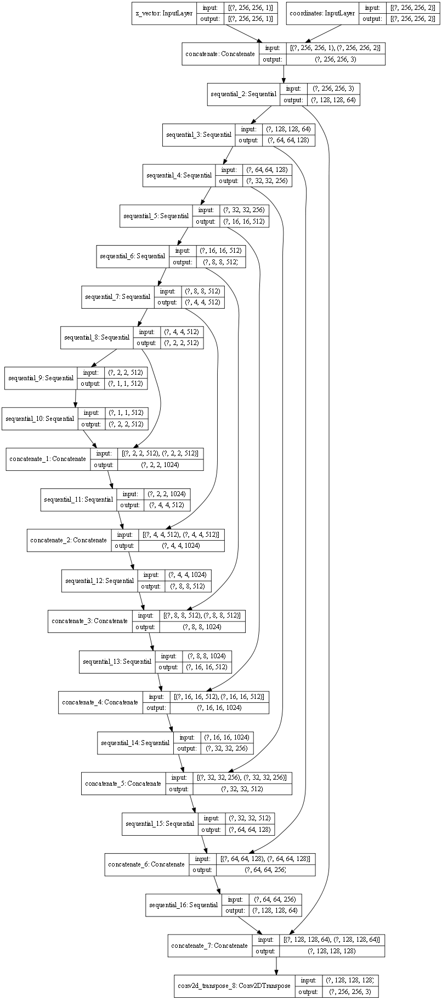

In [25]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

## Plot the Generator output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


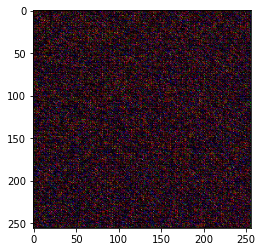

In [26]:
gen_output = generator([z, coord], training=False)
plt.imshow(gen_output[0, ...])

## Define the Generator loss

In [27]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [28]:
def generator_loss(disc_generated_output, gen_output):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  return gan_loss

## Define the Discriminator. Plot the Discriminator training pipeline diagram.
Use the X&Y coordinates vector and the target image to create the 30x30 patches, which classify the 70x70 portions of the image (PatchGAN).

In [29]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  coord = tf.keras.layers.Input(shape=[256, 256, 2], name='coordinates')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([coord, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[coord, tar], outputs=last)

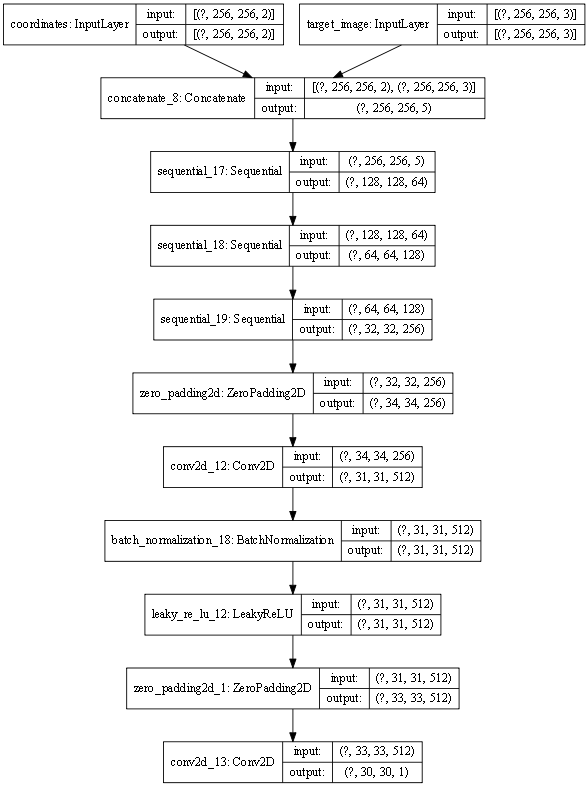

In [30]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

## Plot the patch

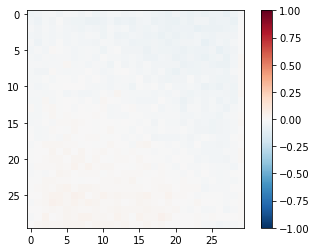

In [31]:
disc_out = discriminator([coord, gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-1, vmax=1, cmap='RdBu_r')
plt.colorbar()

## Define discriminator loss

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

## Create Adam Generator and Discriminator optimizers
Parameters are used from the pix2pix.

In [34]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Create checkpoint and logs savers for later inspection of the predictions and losses

By default, the checkpoint is saved once every 30 epochs.

In [35]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [36]:
def checkpoint_save(epoch, inEpochs = 30):
  if (epoch + 1) % inEpochs == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

In [37]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

## Define the image generation function. Plot the concatenated random noise and coordinates vectors image, the target image and the model's prediction image. 

In [38]:
def generate_images(model, z, coord, tar):
  prediction = model([z[tf.newaxis, ...], coord[tf.newaxis, ...]], training=True)
  plt.figure(figsize=(15, 15))

  display_list = [np.concatenate((z, coord), axis = -1), tar[0], prediction[0]]
  title = ['Z Vector', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


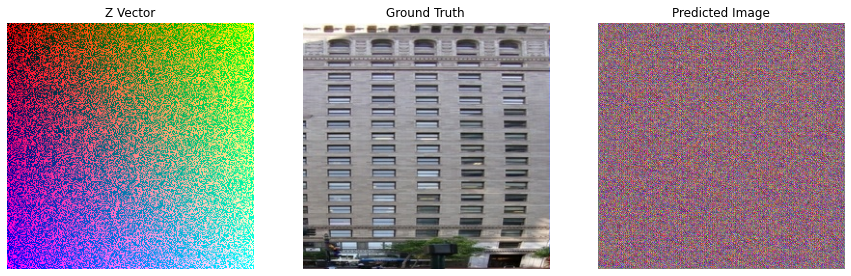

In [39]:
for example_target in test_dataset.take(1):
  z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
  generate_images(generator, z[0], coord[0], example_target)

## Define the train step
Save losses to tensorboard.

In [40]:
@tf.function
def train_step(z, coord, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator([z, coord], training=True)

    disc_real_output = discriminator([coord, target], training=True)
    disc_generated_output = discriminator([coord, gen_output], training=True)

    gen_gan_loss = generator_loss(disc_generated_output, gen_output)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_gan_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

## Define the fit function
Show one prediction for the random image per epoch. Create basic interface (the interface might not work well if using tensorflow.2). Create checkpoints with the default interval and save the last epoch as well. 

# FIX Z IMAGE HERE!

In [41]:
def fit(train_ds, epochs, test_ds):
  coord = coordinates(IMG_WIDTH, IMG_HEIGHT)
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)
    
    for example_target in test_dataset.take(1):
      z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
      generate_images(generator, z[0], coord[0], example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
      train_step(z, coord, target, epoch)
    print()

    checkpoint_save(epoch)
    
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    
  checkpoint.save(file_prefix=checkpoint_prefix)

## Initiate tensorboard to view the losses from the runs

In [42]:
%load_ext tensorboard

In [43]:
%tensorboard --logdir {log_dir} --host localhost --port 8088

Reusing TensorBoard on port 8088 (pid 6156), started 2 days, 1:57:28 ago. (Use '!kill 6156' to kill it.)

## Fit the model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


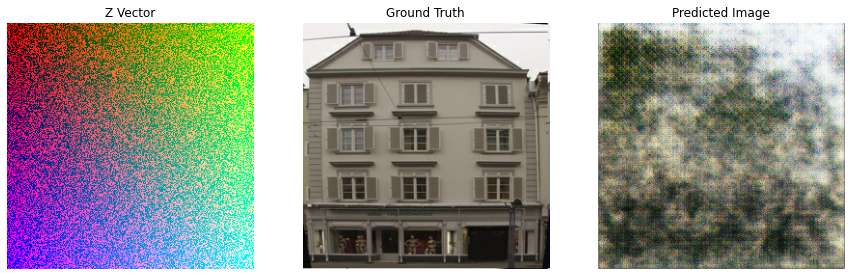

Epoch:  2
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: LIVE_VARS_IN
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: LIVE_VARS_IN
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: LIVE_VARS_IN
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: LIVE_VARS_IN
............................

KeyboardInterrupt: 

In [42]:
fit(train_dataset, EPOCHS, test_dataset)

## List the existing checkpoints

In [107]:
%ls {checkpoint_dir}

Parameter format not correct - "raining_checkpoints".


## Load the checkpoint
By default, the latest checkpoint is loaded. Else, set latest = False and specify the number of the checkpoint)

In [48]:
def load_ckpt(latest = True, number = 1):
  if latest:
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
  else:
    checkpoint.restore('training_checkpoints//ckpt-' + str(number))

In [47]:
load_ckpt()


Two checkpoint references resolved to different objects (<tensorflow.python.keras.engine.sequential.Sequential object at 0x000002868924BDC8> and <tensorflow.python.keras.engine.input_layer.InputLayer object at 0x0000028689223F08>).

Two checkpoint references resolved to different objects (<tensorflow.python.keras.engine.sequential.Sequential object at 0x0000028689262808> and <tensorflow.python.keras.layers.merge.Concatenate object at 0x000002868925CBC8>).

Two checkpoint references resolved to different objects (<tensorflow.python.keras.engine.sequential.Sequential object at 0x000002868927B548> and <tensorflow.python.keras.engine.sequential.Sequential object at 0x000002868924BDC8>).

Two checkpoint references resolved to different objects (<tensorflow.python.keras.engine.sequential.Sequential object at 0x000002868927FEC8> and <tensorflow.python.keras.engine.sequential.Sequential object at 0x0000028689262808>).

Two checkpoint references resolved to different objects (<tensorflow.pytho

ValueError: Shapes (4, 4, 5, 64) and (4, 4, 6, 64) are incompatible

## Plot the predictions for 5 random target images

# Works strangely. When running naked, it plots different predictions from different noises. When running after some training, plots 1 prediction for all the noises.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


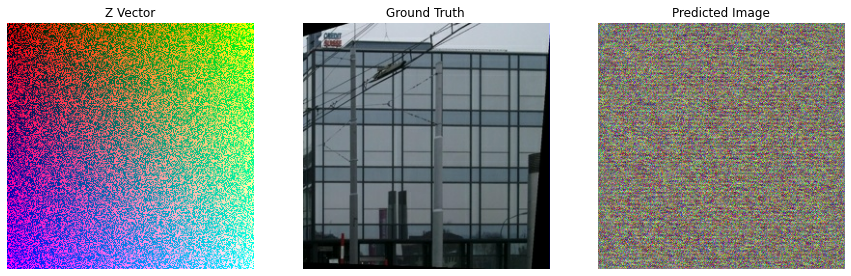

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


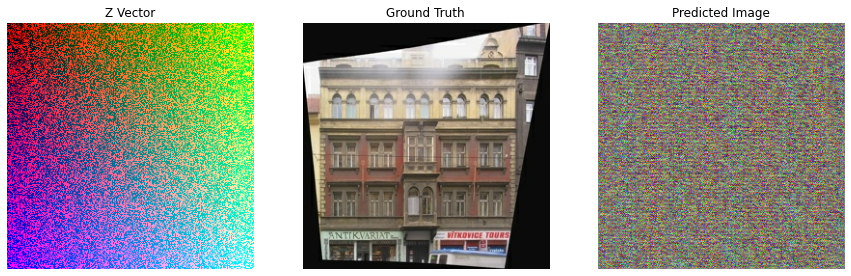

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


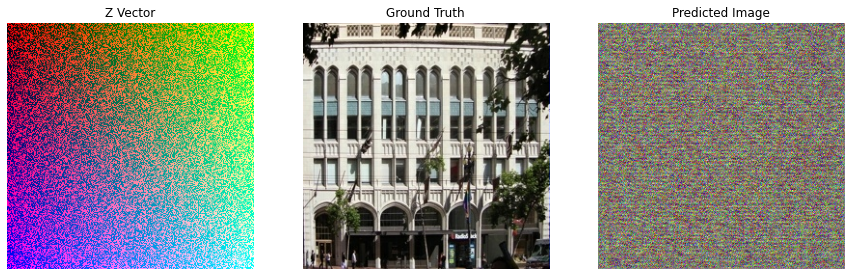

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


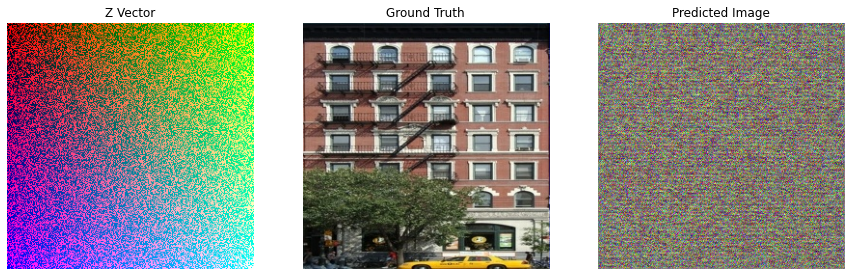

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


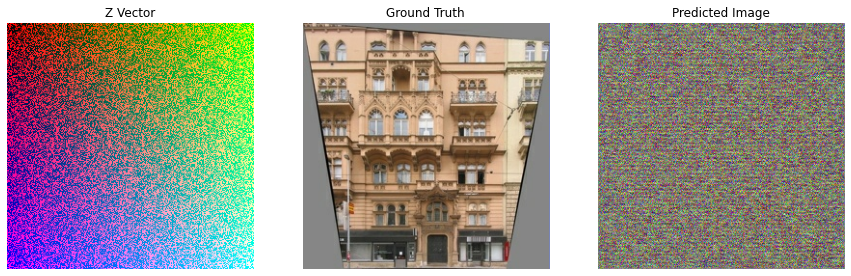

In [111]:
for tar in test_dataset.take(5):
  z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
  generate_images(generator, z[0], coord[0], tar)

## Plot the evolution of predictions based on the checkpoints
Change the parameters in the range to specify the number of first and last checkpoint to be considered.

In [ ]:
for i in range(1, 7):
  load_ckpt(False, i)
  for tar in test_dataset.take(1):
    z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT)
    generate_images(generator, z[0], coord[0], tar)